### Set up

In [1]:
!pip install python-dotenv

In [2]:
import os

import dotenv



In [3]:
import requests
# If you are using a Jupyter Notebook, uncomment the following line.
%matplotlib inline
import matplotlib.pyplot as plt
import json
from PIL import Image
from io import BytesIO

In [4]:
#!wget("https://upload.wikimedia.org/wikipedia/commons/thumb/1/12/Broadway_and_Times_Square_by_night.jpg/450px-Broadway_and_Times_Square_by_night.jpg")

In [5]:
from dotenv import load_dotenv
load_dotenv('.env')

AZURE_COMPUTERVISION_SERVICE = os.getenv("AZURE_COMPUTERVISION_SERVICE")
print(AZURE_COMPUTERVISION_SERVICE)
analyze_url = f"https://{AZURE_COMPUTERVISION_SERVICE}.cognitiveservices.azure.com/vision/v3.2/analyze"

subscription_key = os.getenv("AZURE_COMPUTER_VISION_KEY")
#print(subscription_key)

cb-ai-vision


In [6]:

analyze_url = f"https://{AZURE_COMPUTERVISION_SERVICE}.cognitiveservices.azure.com/vision/v3.2/analyze"

# Set image_url to the URL of an image that you want to analyze.
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/1/12/" + \
    "Broadway_and_Times_Square_by_night.jpg/450px-Broadway_and_Times_Square_by_night.jpg"

#image_url = 'https://github.com/iportilla/MINST/blob/5dbbd5c4bb906c737b838b5e64bb4020b5a4b41e/samples/baby-bear.jpg'

query_image = "images-5360/sites/450px-Broadway_and_Times_Square_by_night.jpg"

headers = {'Ocp-Apim-Subscription-Key': subscription_key}
params = {'visualFeatures': 'Categories,Description,Color'}

data = {'url': image_url}
response = requests.post(analyze_url, headers=headers,
                         params=params, json=data)
response.raise_for_status()

# The 'analysis' object contains various fields that describe the image. The most
# relevant caption for the image is obtained from the 'description' property.
analysis = response.json()
print(json.dumps(response.json()))
image_caption = analysis["description"]["captions"][0]["text"].capitalize()
print(image_caption)


{"categories": [{"name": "outdoor_", "score": 0.00390625, "detail": {"landmarks": []}}, {"name": "outdoor_street", "score": 0.3984375, "detail": {"landmarks": []}}], "color": {"dominantColorForeground": "Brown", "dominantColorBackground": "Brown", "dominantColors": ["Brown"], "accentColor": "B54216", "isBwImg": false, "isBWImg": false}, "description": {"tags": ["building", "outdoor", "street", "city", "people", "busy", "night", "ride", "crowd"], "captions": [{"text": "a busy city street at night", "confidence": 0.5896901488304138}]}, "requestId": "051f154e-41d0-4472-bb36-d48da0efdb1a", "metadata": {"height": 600, "width": 450, "format": "Jpeg"}, "modelVersion": "2021-05-01"}
A busy city street at night


In [7]:
print(json.dumps(response.json(), indent=4))

{
    "categories": [
        {
            "name": "outdoor_",
            "score": 0.00390625,
            "detail": {
                "landmarks": []
            }
        },
        {
            "name": "outdoor_street",
            "score": 0.3984375,
            "detail": {
                "landmarks": []
            }
        }
    ],
    "color": {
        "dominantColorForeground": "Brown",
        "dominantColorBackground": "Brown",
        "dominantColors": [
            "Brown"
        ],
        "accentColor": "B54216",
        "isBwImg": false,
        "isBWImg": false
    },
    "description": {
        "tags": [
            "building",
            "outdoor",
            "street",
            "city",
            "people",
            "busy",
            "night",
            "ride",
            "crowd"
        ],
        "captions": [
            {
                "text": "a busy city street at night",
                "confidence": 0.5896901488304138
            }
      

In [8]:
from azure.cognitiveservices.vision.computervision.models import VisualFeatureTypes

params = {'visualFeatures': [VisualFeatureTypes.tags]}
#params = {'visualFeatures': 'Description'}
data = {'url': image_url}
response = requests.post(analyze_url, headers=headers,
                         params=params, json=data)
response.raise_for_status()

# The 'analysis' object contains various fields that describe the image. The most
# relevant caption for the image is obtained from the 'description' property.
analysis = response.json()
print(json.dumps(response.json()))

print(json.dumps(response.json(), indent=4))

{"tags": [{"name": "building", "confidence": 0.9910046458244324}, {"name": "metropolis", "confidence": 0.9403554201126099}, {"name": "metropolitan area", "confidence": 0.9358730316162109}, {"name": "downtown", "confidence": 0.9340375661849976}, {"name": "outdoor", "confidence": 0.923390805721283}, {"name": "skyscraper", "confidence": 0.9208871126174927}, {"name": "urban area", "confidence": 0.9175581932067871}, {"name": "street", "confidence": 0.889356255531311}, {"name": "commercial building", "confidence": 0.8842800855636597}, {"name": "mixed-use", "confidence": 0.8771032094955444}, {"name": "crowded", "confidence": 0.8658455610275269}, {"name": "night", "confidence": 0.8426154851913452}, {"name": "city", "confidence": 0.8208401203155518}, {"name": "people", "confidence": 0.6946076154708862}, {"name": "light", "confidence": 0.6930657625198364}], "requestId": "37de5f6a-2990-42df-a7ef-d0cce1961819", "metadata": {"height": 600, "width": 450, "format": "Jpeg"}, "modelVersion": "2021-05-0

In [9]:
domain = "landmarks"
url = "https://images.pexels.com/photos/338515/pexels-photo-338515.jpeg"
language = "en"

params = {'analyze_image_by_domain': 'domain, url, language'}

data = {'url': url}
response = requests.post(analyze_url, headers=headers,
                         params=params, json=data)
response.raise_for_status()

# The 'analysis' object contains various fields that describe the image. The most
# relevant caption for the image is obtained from the 'description' property.
analysis = response.json()
print(json.dumps(response.json()))

print(json.dumps(response.json(), indent=4))
#print categories name
print(analysis['categories'][0]['name'])


{"categories": [{"name": "building_", "score": 0.93359375}], "requestId": "2902c767-e41d-4be9-a65e-2eff9ada0b6d", "metadata": {"height": 2000, "width": 3003, "format": "Jpeg"}, "modelVersion": "2021-05-01"}
{
    "categories": [
        {
            "name": "building_",
            "score": 0.93359375
        }
    ],
    "requestId": "2902c767-e41d-4be9-a65e-2eff9ada0b6d",
    "metadata": {
        "height": 2000,
        "width": 3003,
        "format": "Jpeg"
    },
    "modelVersion": "2021-05-01"
}
building_


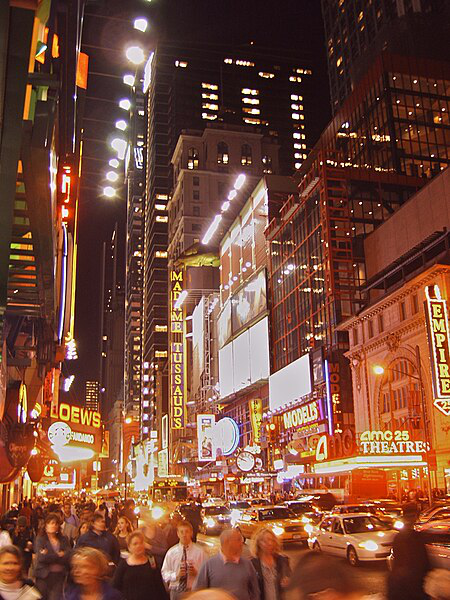

In [10]:
# Display the image and overlay it with the caption.
#image = Image.open(BytesIO(requests.get(image_url).content))
Image.open(query_image)

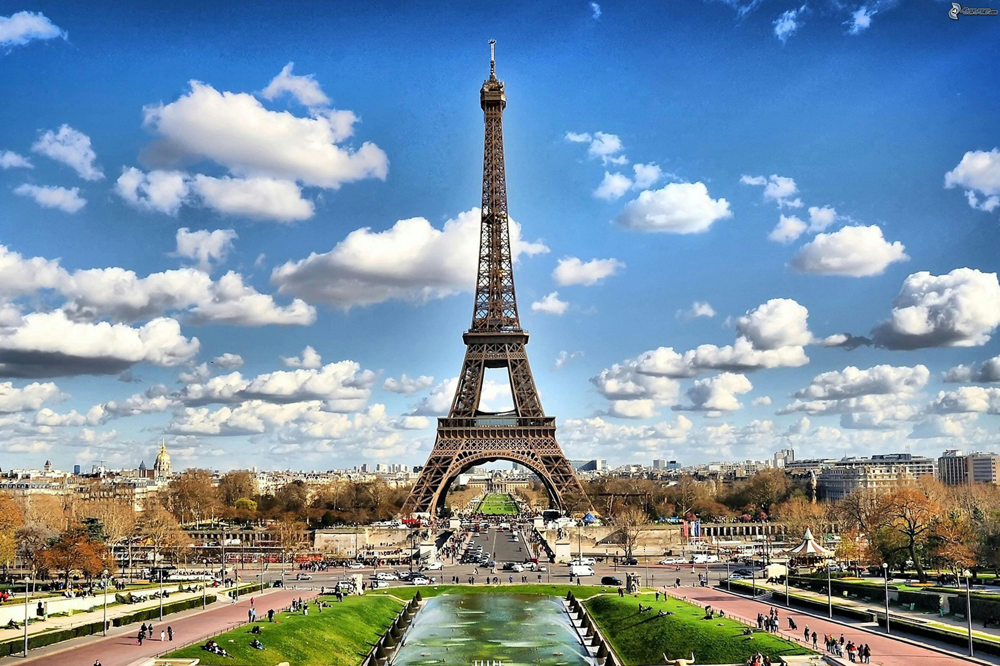

In [11]:
query_image = "images-5360/sites/pexels-photo-338515.jpeg"
Image.open(query_image)